In [50]:
import sys
import pandas
import numpy
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from matplotlib import pyplot as plt
import  plotly.express  as px
from sklearn.naive_bayes import MultinomialNB
from scipy import stats
sys.version

'3.11.3 (tags/v3.11.3:f3909b8, Apr  4 2023, 23:49:59) [MSC v.1934 64 bit (AMD64)]'

In [66]:
csv=pandas.read_csv("./dataset.csv",sep=";")
csv.groupby(['Results']).count()



,review_body,Value
Results,,
1,1000,0
2,1000,0
3,1000,0
4,1000,0
5,1000,0


In [52]:
# create the transform
vectorizerCount = CountVectorizer()
# tokenize and build vocab
vectorizerCount.fit(csv["review_body"])
# summarize
#print(vectorizerCount.vocabulary_)

# sample text
text = ["The quick brown fox jumped over the lazy dog."]


# encode document
vector = vectorizerCount.transform(text)
# summarize encoded vector
print(f"shape: {vector.shape}")
print(f"type of a vector: {type(vector)}")
print(f"Vector array {numpy.array(vector.toarray()[0])}")




shape: (1, 15163)
type of a vector: <class 'scipy.sparse._csr.csr_matrix'>
Vector array [0 0 0 ... 0 0 0]


In [53]:
# create the transform
vectorizerTfidf = TfidfVectorizer()
# tokenize and build vocab
vectorizerTfidf.fit(csv["review_body"])
# summarize
#print(vectorizerTfidf.vocabulary_)
print(vectorizerTfidf.idf_)

# sample texts
text = ["The quick brown fox jumped over the lazy dog.",
		"The dog.",
		"The fox"]


# encode document
vector = vectorizerTfidf.transform([text[0]])
# summarize encoded vector
print(vector.shape)
print(vector.toarray())

[8.41878088 8.41878088 8.82424599 ... 8.82424599 8.82424599 8.82424599]
(1, 15163)
[[0. 0. 0. ... 0. 0. 0.]]


In [54]:
"""sampleText=csv["review_body"][0]
print(sampleText)
print(vectorizerCount.vocabulary_)
vectorizerCount.transform([sampleText]).toarray()[0]"""

'sampleText=csv["review_body"][0]\nprint(sampleText)\nprint(vectorizerCount.vocabulary_)\nvectorizerCount.transform([sampleText]).toarray()[0]'

In [55]:
def transformTextToWordArray(txt):
    ret=[]
    for count in vectorizerCount.transform([txt]).toarray()[0]:
        ret.append(count)
    return ret

reviewWordCounts=[]
for i in range(len(csv)):
    # tmp=[]
    # for count in vectorizerCount.transform([csv["review_body"][i]]).toarray()[0]:
    #     tmp.append(count)
    reviewWordCounts.append(transformTextToWordArray(csv["review_body"][i]))

reviewWordCounts


[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [56]:
X_train, X_test, Y_train, Y_test = train_test_split(numpy.array(reviewWordCounts), csv['Results'].to_numpy(), test_size=0.2, random_state=42)

X_test

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [57]:
model = LinearRegression()
model.fit(X_train, Y_train)

LinearRegression()

In [58]:
predictions=model.predict(X_test)
predictions

array([-4.26229865e+06, -1.46120840e+06, -5.61973474e+07,  1.43636786e+07,
       -6.29780008e+07,  7.83744803e+06,  3.26570479e+07, -1.59144544e+07,
       -8.39594439e+07, -4.26823806e+07,  1.49805178e+07,  9.63466162e+07,
        1.44068423e+07, -1.62224965e+07,  2.75536034e+07, -1.44116664e+07,
        9.29407512e+06, -2.68874206e+07, -7.37050209e+07, -2.99314069e+07,
        3.83427432e+07, -1.19734777e+07, -1.45797673e+07,  6.77745484e+07,
       -5.30350407e+07, -2.81629152e+00,  4.85958314e+06, -1.74509558e+07,
       -2.04727624e+07,  1.51083095e+07,  1.00091266e+07,  1.60062598e+07,
        1.42144579e+06,  2.60726109e+05,  9.55613059e+06,  5.10797714e+07,
       -2.64004831e+07, -2.30819665e+07,  1.47237132e+07,  5.07250833e+07,
        2.70485409e+07, -1.99756122e+07, -3.45781835e+07,  1.82843823e+06,
        9.55416957e+07,  3.30759209e+07, -2.50863161e+07, -6.02679197e+07,
        2.46877849e+07, -4.80308919e+07, -9.41922573e+06, -4.53042428e+06,
       -1.81185223e+07, -

In [68]:
mse=numpy.mean((predictions-Y_test)**2)
print(f"Linear Regression {mse}")

df=pandas.DataFrame()
df["predictions"]=predictions
df["Y_test"]=Y_test


    
# Linear Regression ist wahrscheinlich echt ein schlechtes Modell für das Problem, da die Werte so weit voneinander entfern sind!
df

Linear Regression 4956376040440312.0


,predictions,Y_test
0,-4.262299e+06,2
1,-1.461208e+06,3
2,-5.619735e+07,3
3,1.436368e+07,2
4,-6.297800e+07,1
...,...,...
995,2.015187e+06,5
996,-1.260545e+07,3
997,5.388450e+07,4
998,-3.208414e+07,3


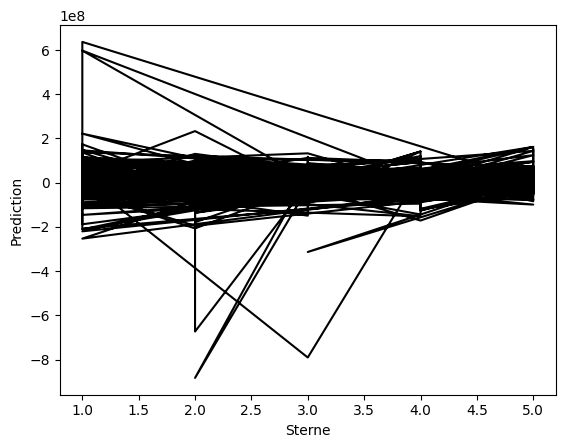

5

In [60]:

#plt.scatter(X_test, Y_test,color='g')
plt.plot(Y_test, predictions,color='k')
plt.xlabel("Sterne")
plt.ylabel("Prediction")

plt.show()

numpy.max(Y_test)

In [61]:
nb = MultinomialNB()
nb.fit(X_train, Y_train)

MultinomialNB()

In [62]:
Y_predict = nb.predict(X_test)
df=pandas.DataFrame()
df["predictions"]=Y_predict
df["Y_test"]=Y_test
print(df)

# plt.scatter(Y_test, Y_predict,color='k')
# plt.xlabel("Sterne")
# plt.ylabel("Prediction")

# plt.show()

# plt.imshow([Y_test,Y_predict], cmap='hot', interpolation='nearest')
# plt.show()
kernel=stats.gaussian_kde([df["predictions"],df["Y_test"]])
df["z"]=kernel([df["predictions"],df["Y_test"]])

fig=px.scatter(df,x=df["predictions"],y=df["Y_test"],color="z",color_continuous_scale=px.colors.sequential.Bluered)
fig.update_layout(xaxis_title="predictions",yaxis_title="Ratings")
fig.show()

mse=numpy.mean((Y_predict-Y_test)**2)
mse

     predictions  Y_test
0              2       2
1              4       3
2              4       3
3              1       2
4              1       1
..           ...     ...
995            4       5
996            2       3
997            4       4
998            2       3
999            2       2

[1000 rows x 2 columns]


1.365

In [77]:
userInput="none"
while userInput:
    
    userInput=input("Enter a review to rate:")  
    for i in range(130):
        print(" ",end="")
    print("",end="\r")  
    print(f"{nb.predict([transformTextToWordArray(userInput)])[0]} - {userInput}", flush=True, end="\r")